In [1]:
import os

import numpy as np
import imageio.v3 as iio
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter, sobel
from skimage.feature import SIFT, match_descriptors
from skimage.transform import estimate_transform, warp
from sklearn.linear_model import RANSACRegressor

resource_folder = './resources/tiff'
image_size = 6

(27, 1600, 1600)

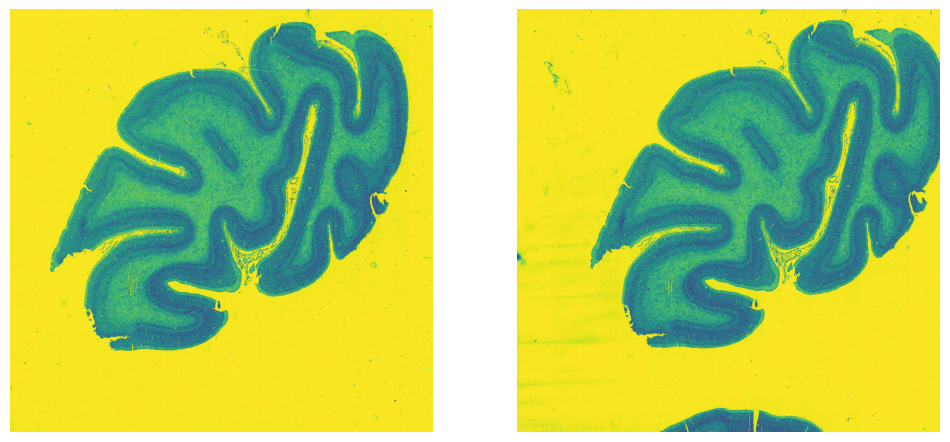

In [2]:
def read_images(path):
    return [iio.imread(os.path.join(path, file)) for file in os.listdir(path)]


images = read_images(resource_folder)
images = np.array([np.pad(image[:1600, :1599], ((0, 0), (0, 1)), mode='edge') for image in images])
display(images.shape)

img1, img2 = images[0], images[1]

_, axes = plt.subplots(1, 2, figsize=(2 * image_size, image_size))
for image, ax in zip([img1, img2], axes.flatten()):
    ax.imshow(image)
    ax.axis('off')
plt.show()

## Task 1: Find Key Points

In [3]:
def get_kp_extractor(image):
    feat_detector = SIFT()  # each image needs it's own instance of SIFT anyway
    feat_detector.detect_and_extract(image)
    return feat_detector

In [4]:
feats1, feats2 = get_kp_extractor(img1), get_kp_extractor(img2)

## Task 2: Matching

In [5]:
def match(descriptors1, descriptors2):
    """
    :return: numpy array of shape (n, 2) of matched kp indices
    """
    return match_descriptors(descriptors1, descriptors2, cross_check=True, max_ratio=.8)

## Task 3: Remove Outliers / RANSAC

In [6]:
def rm_outliers(matched_kps):
    """
    :return: bool mask of inliers
    """
    model = RANSACRegressor(random_state=42)
    model.fit(matched_kps[:, 0], matched_kps[:, 1])
    return model.inlier_mask_

## Task 4: Calculate Transforms

In [7]:
def calc_transform(matched_points):
    """
    :param matched_points:
    :return: inverse transform matrix
    """
    return estimate_transform('affine', src=matched_points[:, 0], dst=matched_points[:, 1]).inverse

## Task 5: Apply Transforms

In [8]:
apply_transform = warp

In [9]:
def display_transform(original_src_img, aligned_src_img, dest_img):
    fig, axes = plt.subplots(ncols=2, figsize=(16, 8))

    fig.suptitle('KP Matched Transforms')

    axes[0].grid(False)
    axes[0].set_title('Original')
    axes[0].imshow(dest_img, cmap='gray')
    axes[0].imshow(original_src_img, cmap='gray', alpha=0.5)

    axes[1].grid(False)
    axes[1].set_title('Aligned')
    axes[1].imshow(dest_img, cmap='gray')
    axes[1].imshow(aligned_src_img, cmap='gray', alpha=0.5)

In [10]:
def display_matches(image1, image2, filtered_matched_kp, k=100):
    k = min(k, len(filtered_matched_kp))
    fig, axes = plt.subplots(ncols=2, figsize=(16, 8))

    points1 = filtered_matched_kp[:, 0][:k]
    points2 = filtered_matched_kp[:, 1][:k]

    cmap = plt.get_cmap('tab10')
    c = [cmap(i) for i in np.linspace(0, 1, k)]

    fig.suptitle('Matching KPs')

    axes[0].grid(False)
    axes[0].imshow(image1, cmap='gray')
    axes[0].scatter(points1[:, 0], points1[:, 1], marker='x', c=c)

    axes[1].grid(False)
    axes[1].imshow(image2, cmap='gray')
    axes[1].scatter(points2[:, 0], points2[:, 1], marker='x', c=c)

In [11]:
def pipeline(image1, image2, max_kps=10000):
    print('start kp extraction.')
    ext1, ext2 = get_kp_extractor(image1), get_kp_extractor(image2)
    print(f'extraction successful. image1: {len(ext1.descriptors)} kps | image2: {len(ext2.descriptors)} kps.')

    if len(ext1.descriptors) > max_kps or len(ext2.descriptors) > max_kps:
        print(f'too many kps. reducing to {max_kps} each.')
    descriptors = ext1.descriptors[:max_kps], ext2.descriptors[:max_kps]
    kps = ext1.keypoints[:max_kps], ext2.keypoints[:max_kps]

    print('start matching.')
    matches = match(*descriptors)
    print(f'matching successful. matched {len(matches)} kps.')

    matched_kps = np.concat((kps[0][:, ::-1][matches[:, 0]][:, None],
                             kps[1][:, ::-1][matches[:, 1]][:, None]),
                            axis=1)
    print('start outlier removal.')
    inlier_mask = rm_outliers(matched_kps)
    filtered_matched_kps = matched_kps[inlier_mask]
    print(f'outlier removal successful. dropped: {len(matched_kps) - len(filtered_matched_kps)} kps | remaining: {len(filtered_matched_kps)} kps.')

    print('calculate transform.')
    inverse_matrix = calc_transform(filtered_matched_kps)
    print('transform calculated.')

    print('apply transform.')
    aligned_image1 = apply_transform(image1, inverse_matrix)
    print('transform applied.')

    print('display matches and transform...')
    display_matches(image1, image2, filtered_matched_kps)
    display_transform(image1, aligned_image1, image2)

start kp extraction.
extraction successful. image1: 8715 kps | image2: 8985 kps.
start matching.
matching successful. matched 346 kps.
start outlier removal.
outlier removal successful. dropped: 37 kps | remaining: 309 kps.
calculate transform.
transform calculated.
apply transform.
transform applied.
display matches and transform...


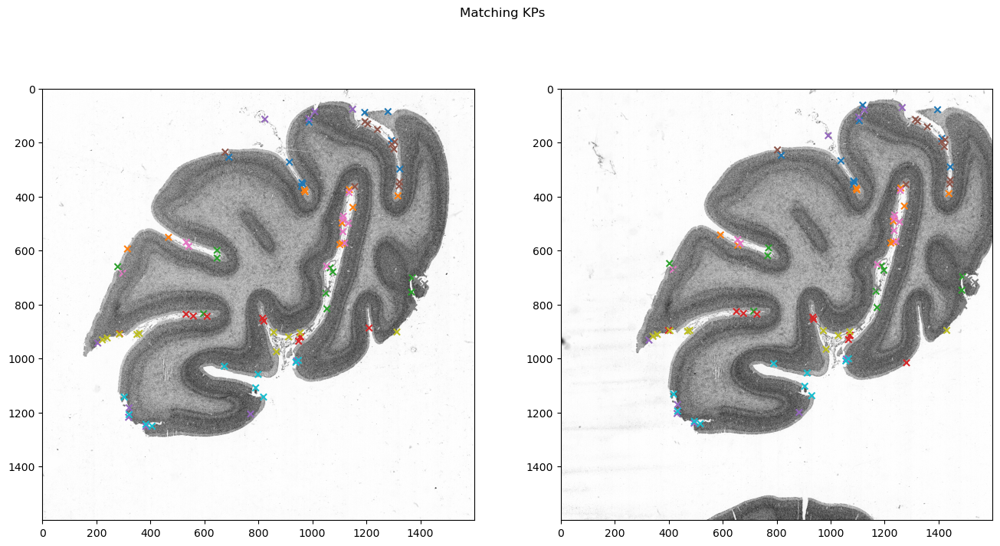

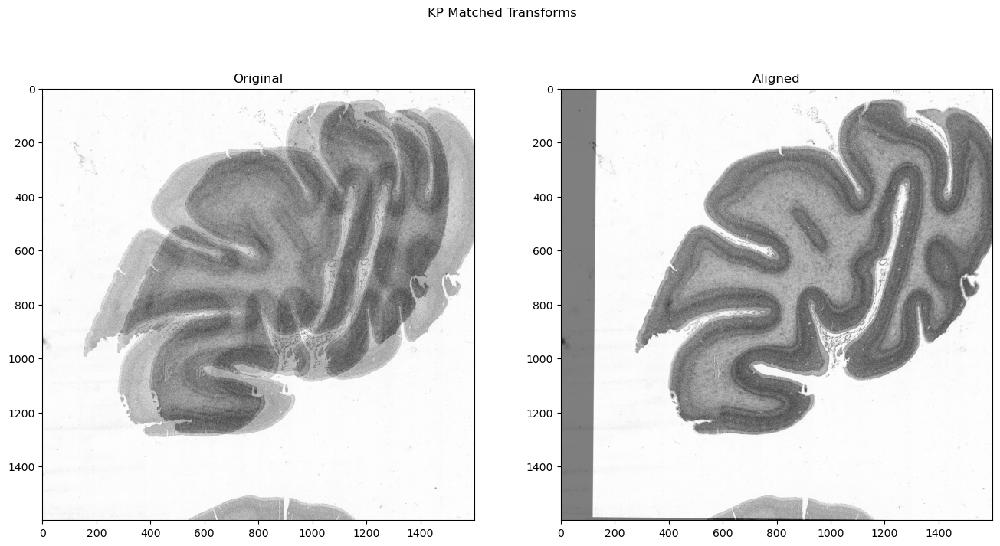

In [12]:
pipeline(images[0], images[1])

## Task 6: Try Different Filters

start kp extraction.
extraction successful. image1: 121 kps | image2: 110 kps.
start matching.
matching successful. matched 83 kps.
start outlier removal.
outlier removal successful. dropped: 2 kps | remaining: 81 kps.
calculate transform.
transform calculated.
apply transform.
transform applied.
display matches and transform...


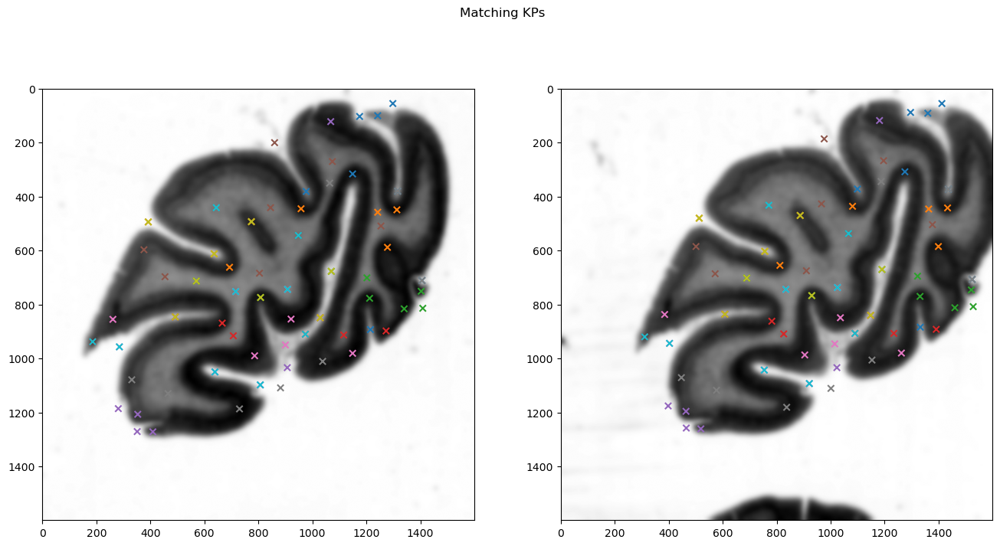

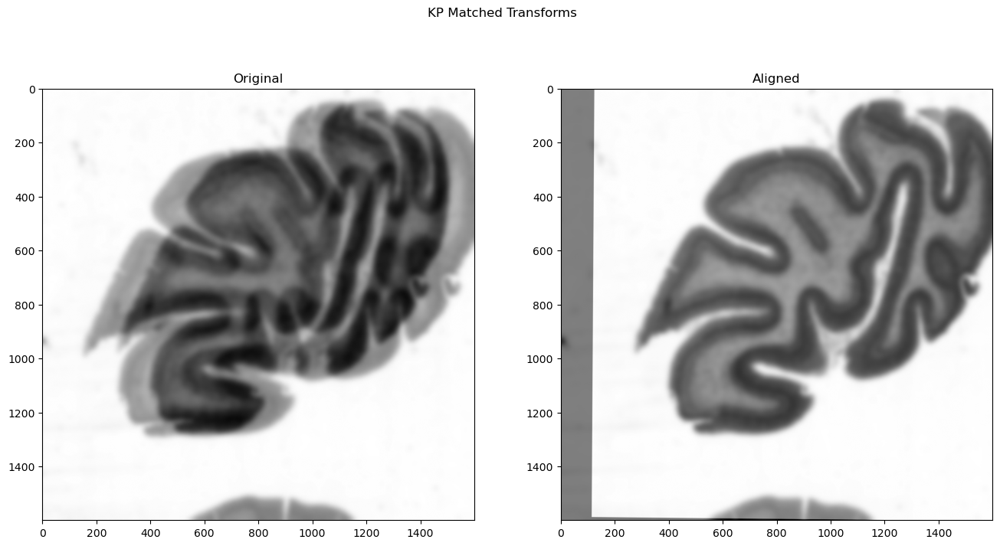

In [13]:
pipeline(gaussian_filter(images[0], sigma=10), gaussian_filter(images[1], sigma=10))

start kp extraction.
extraction successful. image1: 15 kps | image2: 12 kps.
start matching.
matching successful. matched 10 kps.
start outlier removal.
outlier removal successful. dropped: 0 kps | remaining: 10 kps.
calculate transform.
transform calculated.
apply transform.
transform applied.
display matches and transform...


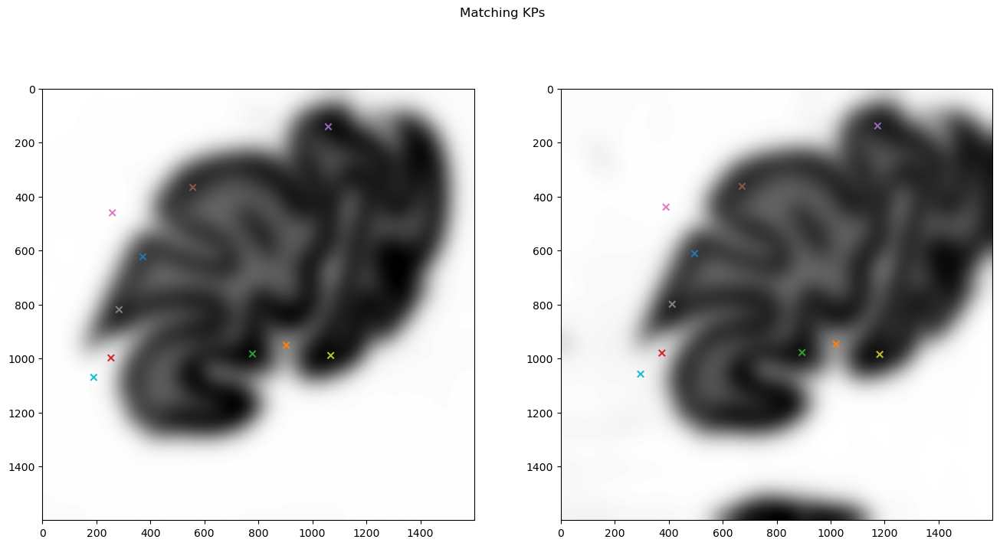

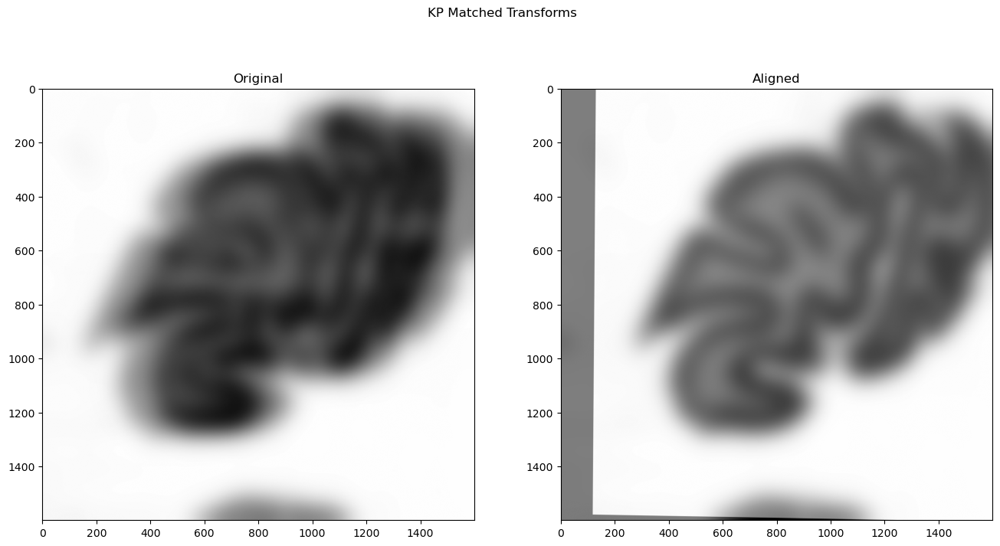

In [14]:
pipeline(gaussian_filter(images[0], sigma=40), gaussian_filter(images[1], sigma=40))

start kp extraction.
extraction successful. image1: 53316 kps | image2: 51725 kps.
too many kps. reducing to 10000 each.
start matching.
matching successful. matched 8 kps.
start outlier removal.
outlier removal successful. dropped: 3 kps | remaining: 5 kps.
calculate transform.
transform calculated.
apply transform.
transform applied.
display matches and transform...


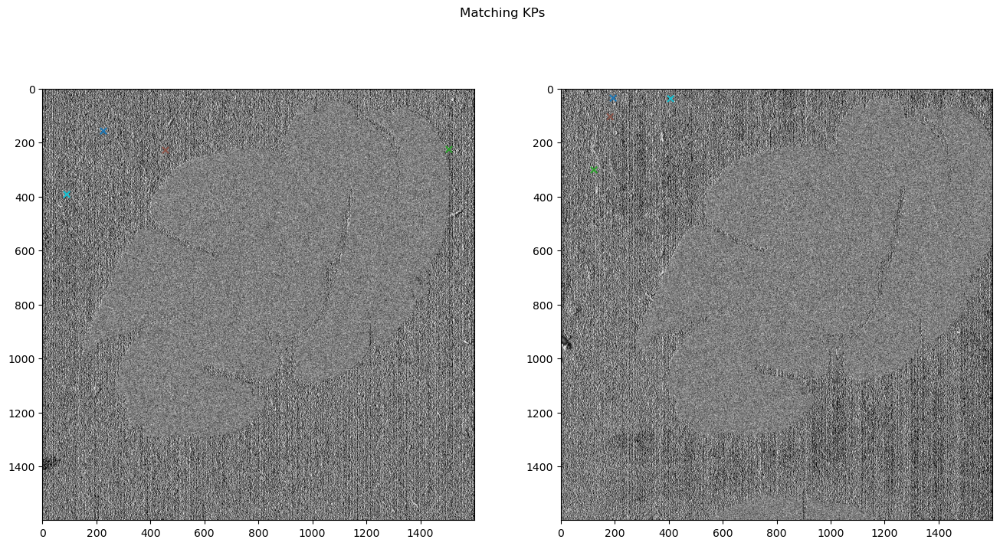

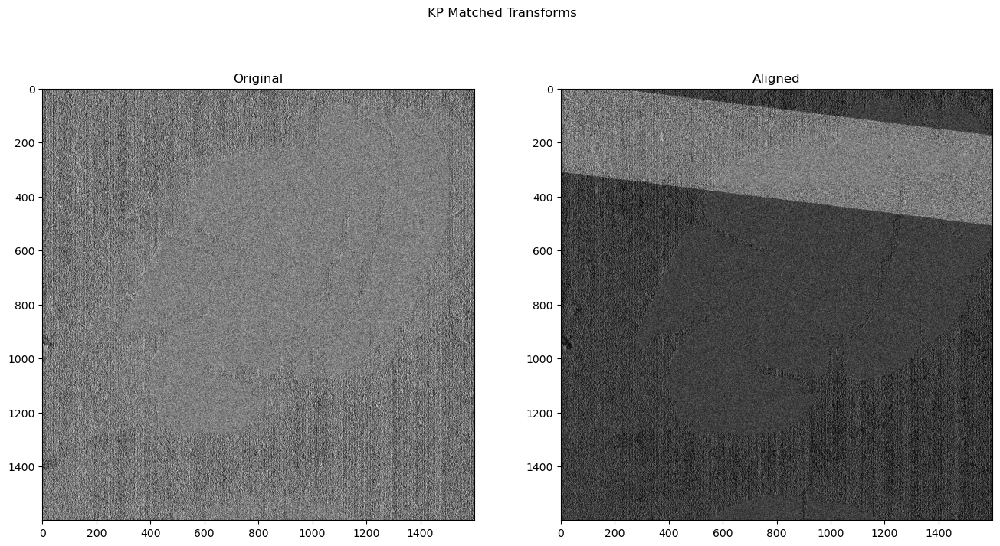

In [15]:
pipeline(sobel(images[0]), sobel(images[1]))

start kp extraction.
extraction successful. image1: 22760 kps | image2: 19665 kps.
too many kps. reducing to 10000 each.
start matching.
matching successful. matched 8 kps.
start outlier removal.
outlier removal successful. dropped: 4 kps | remaining: 4 kps.
calculate transform.
transform calculated.
apply transform.
transform applied.
display matches and transform...


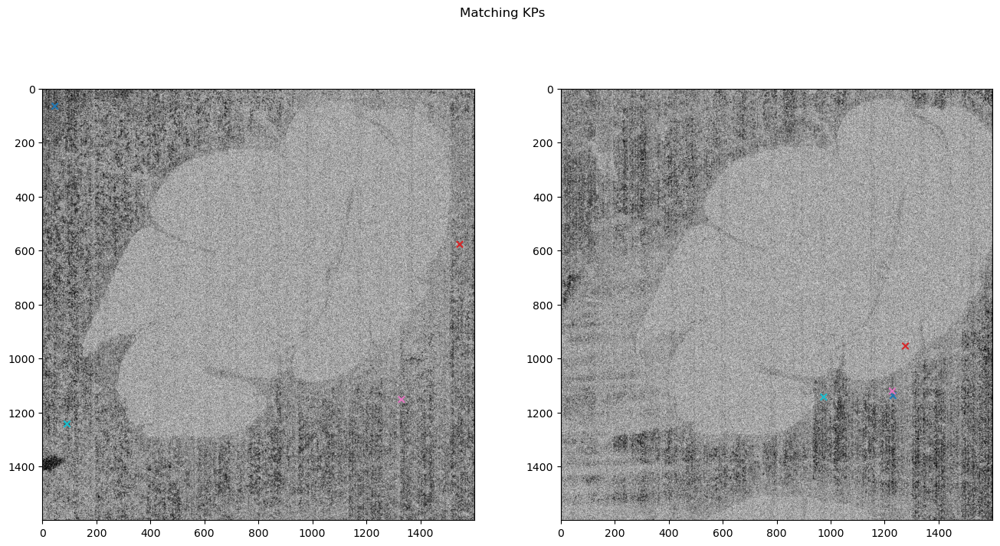

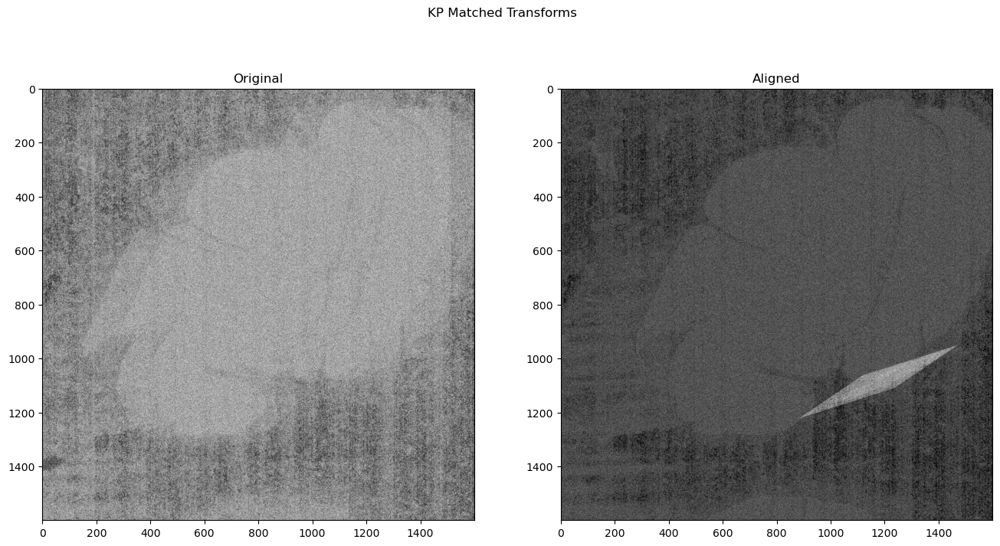

In [22]:
def calc_magnitude(image):
    sobel_h = sobel(image, 0)
    sobel_v = sobel(image, 1)
    magnitude = (sobel_h ** 2 + sobel_v ** 2) ** 0.5
    return (magnitude - magnitude.min()) / (magnitude.max() - magnitude.min())

magnitude1, magnitude2 = calc_magnitude(images[0]), calc_magnitude(images[1])
pipeline(magnitude1, magnitude2)

start kp extraction.
extraction successful. image1: 8336 kps | image2: 8859 kps.
start matching.
matching successful. matched 851 kps.
start outlier removal.
outlier removal successful. dropped: 444 kps | remaining: 407 kps.
calculate transform.
transform calculated.
apply transform.
transform applied.
display matches and transform...


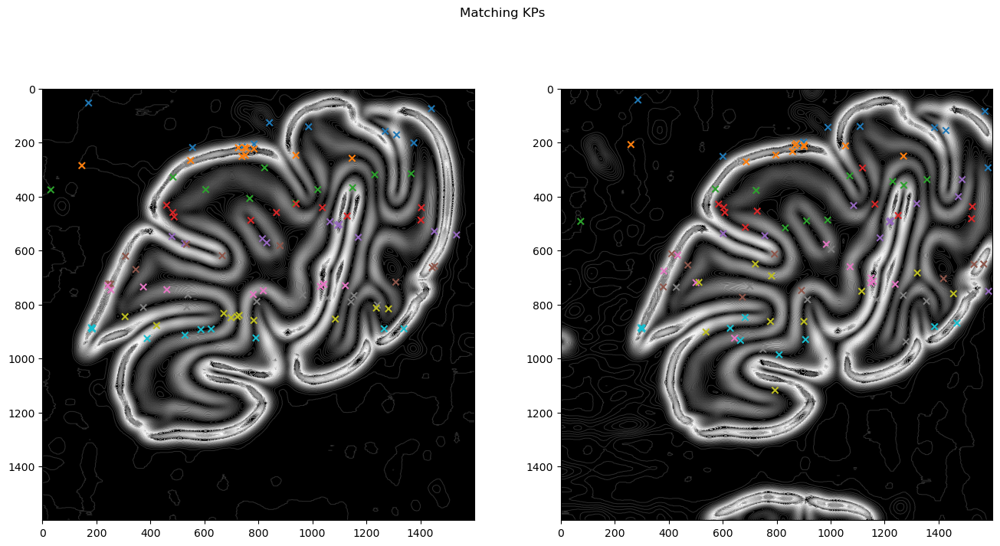

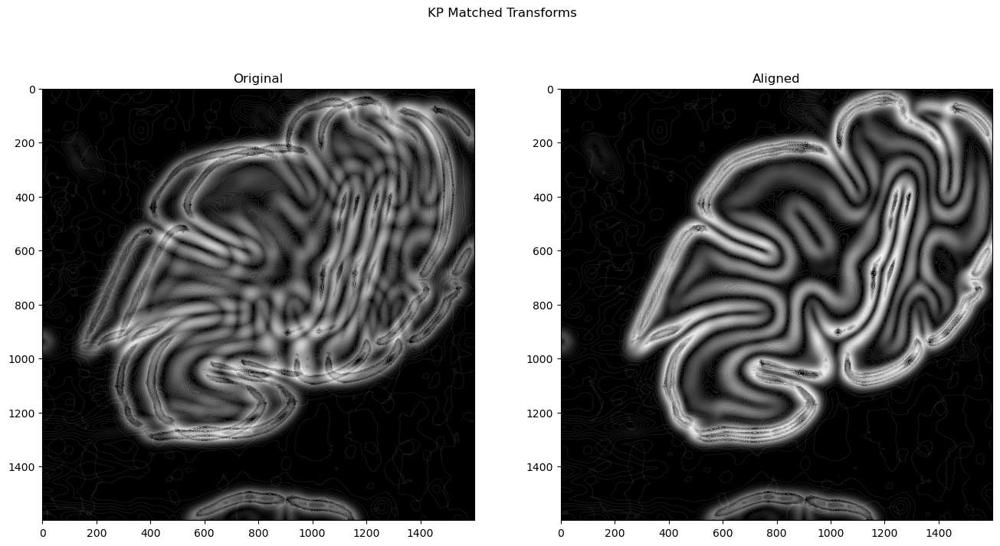

In [23]:
gaussian1, gaussian2 = gaussian_filter(images[0], sigma=20), gaussian_filter(images[1], sigma=20)
magnitude1, magnitude2 = calc_magnitude(gaussian1), calc_magnitude(gaussian2)
pipeline(magnitude1, magnitude2)

Interesting, that gaussian then sobel/magnitude filter works so well, whereas without gaussian it doesn't work at all.
This should be enough filters.